In [1]:
import pandas
import numpy
import scipy.stats as stats
import networkx
import seaborn
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pyreadstat
import math

In [2]:
df_original, meta_original = pyreadstat.read_sav("data-covid-source.sav")
print(f"There're {len(df_original.columns)} variables in the data:")
pandas.set_option('display.max_columns', None)
# pandas.set_option("display.max_rows", None)
pandas.set_option("display.precision", 1)
display(df_original.describe(percentiles=[]).transpose())
pandas.reset_option("max_columns")
# pandas.reset_option("max_rows")
pandas.reset_option("precision")

There're 510 variables in the data:


,count,mean,std,min,50%,max
Id,547.0,400.4,234.9,1.0,389.0,832.0
ATT_1_1,547.0,3.0,0.0,3.0,3.0,3.0
ATT_1_2,547.0,6.0,0.0,6.0,6.0,6.0
TIME_1,547.0,2026.2,3907.8,221.0,1274.0,55552.0
TIME_2,547.0,2363.2,5401.8,264.0,1408.0,88447.0
...,...,...,...,...,...,...
Wiedza_koronavir_t5,547.0,-0.3,0.2,-0.6,-0.3,0.2
WHO_FIZ_t4,547.0,5.9,1.7,1.0,6.0,9.0
WHO_SPOL_t4,547.0,6.2,1.7,1.0,6.5,9.0
BOGARDUS_uchodz_t4,547.0,2.7,1.1,1.0,2.6,5.0


In the above table there's some basic information on 510 variables measuring various psychological metrics from a longitude study of 547 people.<br>
There were 5 measurements, each one week apart from the others.<br>
The variables encode the number of measurement in their name by appending "\_t2", \_t3", ... to their name. For the first measurement "\_t1" is sometimes appended, sometimes not, depending on the variable.<br>
For some variables, not all 5 measurements are present - for example for communal narcissm ("cni" in the source data) the measurements are from week 1 and week 5 only. In the "cni" example, there are 16 variables from "cni1" to "cni16" describing various 16 metrics of communal narcissm, and are followed up with "cni1_t5" to "cni16_t5" (where "\_t5" indicates the week no. 5 of measurement taken).

The goal of this excercise is to:<br>
1. perform paired sample t-test for following measurements;
1. compute [Cohen's d - effect size value](https://en.wikipedia.org/wiki/Effect_size#Cohen's_d);
1. plot the change in time (with mean trajectories);
1. compute partial correlation networks and basic networks' metrics;
1. plot the networks (with only signifcant changes - uncorrected p>0.05);
1. plot correlogram for average absolute edge values between and within questionnaires;
1. plot basic graphs' metrics for particular measurements at different times to easily observe change (or lack of thereof);
1. compute and show in correlation matrix the Pearson's correlation of considered variables

Only selected variables are to be considered, and those are:
1. Knowledge ("wiedza");
1. Communal Narcissim ("cni");

As may be observed in the commits history, previously more variables were considered, but the decision was made to consider only CNI and knowledge relation change in this notebook, Dark Triad to gender relation change and WHO in the other notebooks (available in this repository).


In [3]:
desired_variable_names = ['cni', 'wiedza']
variable_list = []

for column in df_original.columns:
    if any(d in column for d in desired_variable_names):
        variable_list.append(column)
variable_list.sort(reverse=True)

pandas.set_option('display.max_columns', None)
pandas.set_option("display.max_rows", None)
pandas.set_option("display.precision", 1)
display(df_original[variable_list].describe(percentiles=[]).transpose().head())
pandas.reset_option("max_columns")
pandas.reset_option("max_rows")
pandas.reset_option("precision")

,count,mean,std,min,50%,max
wiedza9_t5,547.0,1.8,0.4,1.0,2.0,2.0
wiedza9,547.0,0.2,0.4,0.0,0.0,1.0
wiedza8_t5,547.0,1.9,0.3,1.0,2.0,2.0
wiedza8,547.0,0.1,0.4,0.0,0.0,1.0
wiedza7_t5,547.0,1.4,0.5,1.0,1.0,2.0


Let's match variable names from first study with second (week 4 or week 5) study:

In [4]:
varaibles_time_pairs_dict = dict()
for variable_candidate in variable_list:
    for match_candidate in variable_list:
        if variable_candidate is not match_candidate:
            if variable_candidate in match_candidate:
                varaibles_time_pairs_dict[variable_candidate] = match_candidate

# Let me correct a wrong match manually:
varaibles_time_pairs_dict['cni1'] = 'cni1_t5'

For each of paired weeks of measurement for given variable, let's calculate the paired sample t-test:

In [5]:
paired_tests_dict = dict()
var_pairs_null_hypo_dict = dict()
var_pairs_alter_hypo_dict = dict()

for var_week_1, var_week_2 in varaibles_time_pairs_dict.items():
    pre = df_original[var_week_1]
    post = df_original[var_week_2]
    paired_tests_dict[f"{var_week_1}-{var_week_2}"] = stats.ttest_rel(pre, post)

print("Variable pairs for which a test for the null hypothesis that two \n(related as mentioned above) samples have identical average values holds \n(null hypothesis is NOT rejected):\n")
for var_pair, result_obj in paired_tests_dict.items():
    if result_obj.pvalue >= 0.05:
        var_pairs_null_hypo_dict[var_pair] = result_obj
        print(f"{var_pair:33} - p-value: {result_obj.pvalue:.3f}")

print("\nVariable pairs for which a test for the null hypothesis that two \nsamples have identical average values fails \n(null hypothesis IS rejected):\n")
for var_pair, result_obj in paired_tests_dict.items():
    if result_obj.pvalue < 0.05:
        var_pairs_alter_hypo_dict[var_pair] = result_obj
        print(f"{var_pair:33} - p-value: {result_obj.pvalue:.3f}, statistic: {result_obj.statistic:.3f}")

Variable pairs for which a test for the null hypothesis that two 
(related as mentioned above) samples have identical average values holds 
(null hypothesis is NOT rejected):

cni9-cni9_t5                      - p-value: 0.721
cni8-cni8_t5                      - p-value: 0.118
cni7-cni7_t5                      - p-value: 0.422
cni5-cni5_t5                      - p-value: 1.000
cni4-cni4_t5                      - p-value: 0.162
cni3-cni3_t5                      - p-value: 0.075
cni16-cni16_t5                    - p-value: 0.485
cni14-cni14_t5                    - p-value: 1.000
cni11-cni11_t5                    - p-value: 0.754

Variable pairs for which a test for the null hypothesis that two 
samples have identical average values fails 
(null hypothesis IS rejected):

wiedza9-wiedza9_t5                - p-value: 0.000, statistic: -60.423
wiedza8-wiedza8_t5                - p-value: 0.000, statistic: -71.396
wiedza7-wiedza7_t5                - p-value: 0.000, statistic: -46.737
wiedza6-

Let's calculate the Cohen's d value - the difference between two means divided by a standard deviation for the data.<br>
$d = \frac{\bar{x}_1 - \bar{x}_2}{s}$
, where s is [pooled variance](https://en.wikipedia.org/wiki/Pooled_variance):<br>
$s = \sqrt{\frac{(n_1 - 1)s^2_1 + (n_2 - 1)s^2_2}{n_1 + n_2 - 2}}$
<br>
and where $s^2 = \frac{1}{n  - 1}\sum_{i=1}^{n}(x_i - \bar{x})^2$<br>
A positive d indicates that the first mean is higher. In contrast, a negative d indicates that the second mean is higher. A lower Cohen's d indicates the necessity of larger sample sizes, and vice versa - [Wikipedia](https://en.wikipedia.org/wiki/Effect_size#Cohen's_d)

In [6]:
import statistics

d_value_per_pair_dict = dict()
s_sqr = lambda l, a: (1/(len(l) - 1)) * (sum(map(lambda x: (x - a) ** 2, l)))
effect_size = lambda x: "very small" if abs(x)<0.01 else "small" if abs(x)<0.2 else "medium" if abs(x)<0.5 else "large" if abs(x)<0.8 else "very large" if abs(x)<1.2 else "huge"

for var_week_1, var_week_2 in varaibles_time_pairs_dict.items():
    s_sqr_week_1 = s_sqr(df_original[var_week_1], statistics.mean(df_original[var_week_1]))
    s_sqr_week_2 = s_sqr(df_original[var_week_2], statistics.mean(df_original[var_week_2]))
    len_week_1 = len(df_original[var_week_1])
    len_week_2 = len(df_original[var_week_2])
    pooled_var_s = (((len_week_1 - 1) * s_sqr_week_1 + (len_week_2 - 1) * s_sqr_week_2) / (len_week_1 + len_week_2 - 2)) ** 0.5
    d_value_per_pair_dict[f"{var_week_1}-{var_week_2}"] = (statistics.mean(df_original[var_week_1]) - statistics.mean(df_original[var_week_2])) / pooled_var_s

for var_pair in var_pairs_alter_hypo_dict.keys():
    print(f"{var_pair:30}: {d_value_per_pair_dict[var_pair]:6.3f} ({effect_size(d_value_per_pair_dict[var_pair])})")

wiedza9-wiedza9_t5            : -4.007 (huge)
wiedza8-wiedza8_t5            : -4.975 (huge)
wiedza7-wiedza7_t5            : -2.777 (huge)
wiedza6-wiedza6_t5            : -2.320 (huge)
wiedza5-wiedza5_t5            : -5.666 (huge)
wiedza4-wiedza4_t5            : -4.378 (huge)
wiedza3-wiedza3_t5            : -4.238 (huge)
wiedza2-wiedza2_t5            : -0.624 (large)
wiedza1-wiedza1_t5            : -3.745 (huge)
cni6-cni6_t5                  :  0.110 (small)
cni2-cni2_t5                  :  0.086 (small)
cni15-cni15_t5                :  0.102 (small)
cni13-cni13_t5                :  0.106 (small)
cni12-cni12_t5                :  0.100 (small)
cni10-cni10_t5                :  0.118 (small)
cni1-cni1_t5                  : -0.110 (small)


For graph plotting purpose, let me reshape the data more suitably (into one dataframe, organised by test participants instead of tests):

In [7]:
new_df_column_names = ['Id', 'test', 'before', 'after']
paired_plot_data_df = pandas.DataFrame(columns=new_df_column_names)
paired_plot_data_list = []

index = 0
for _, row in df_original.iterrows():
    for var_week_1, var_week_2 in varaibles_time_pairs_dict.items():
        index += 1
        new_row = {'Id': row['Id'],
                   'test': var_week_1,
                   'before': row[var_week_1],
                   'after': row[var_week_2]
                  }
        paired_plot_data_list.append(new_row)
paired_plot_data_df = pandas.DataFrame.from_records(paired_plot_data_list)
display(paired_plot_data_df[paired_plot_data_df['Id'] == 7])

,Id,test,before,after
0,7.0,wiedza9,0.0,2.0
1,7.0,wiedza8,0.0,2.0
2,7.0,wiedza7,0.0,1.0
3,7.0,wiedza6,0.0,1.0
4,7.0,wiedza5,0.0,2.0
5,7.0,wiedza4,0.0,2.0
6,7.0,wiedza3,0.0,2.0
7,7.0,wiedza2,1.0,1.0
8,7.0,wiedza1,0.0,2.0
9,7.0,cni9,1.0,1.0


Let me display some demographic data:

In [8]:
display(df_original[['sex', 'age', 'wyksztalcenie']].describe(percentiles=[]).transpose())
display(df_original.groupby('sex')['Id'].nunique())
display(df_original.groupby('wyksztalcenie')['Id'].nunique())

,count,mean,std,min,50%,max
sex,547.0,1.458867,0.498761,1.0,1.0,2.0
age,547.0,46.950640,14.585837,18.0,48.0,78.0
wyksztalcenie,547.0,4.201097,1.552429,1.0,4.0,6.0


sex
1.0    296
2.0    251
Name: Id, dtype: int64

wyksztalcenie
1.0     12
2.0     50
3.0    192
4.0     55
5.0     38
6.0    200
Name: Id, dtype: int64

The next step is to plot the mean trajectories of change.
On high level, the changes we're interested in are:
1. knowledge ("wiedza") (9 questions - range from 0 to 2);
1. Communal Narcissim ("cni") (7 questions) (range from 1 to 7);

The input data is just a measured answer for particular questions in a survey at some two points in time. In case of knowledge-related variables the data are 0 or 1 for first measurement and 1 or 2 for the second measurement, so I can't plot this as-is since it won't be meaningful. Let me plot the changes in sum of answers for knowledge and communal narcissim:

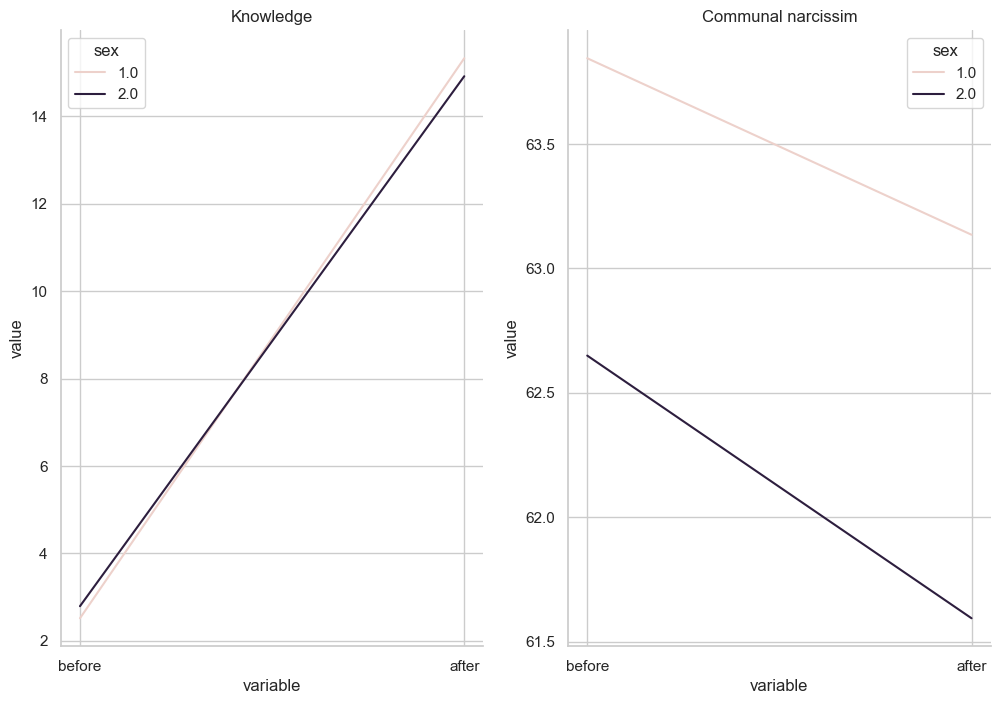

In [9]:
aggregated_knowledge_df = pandas.melt(paired_plot_data_df[paired_plot_data_df["test"].str.contains('wiedza')].groupby("Id")[["before", "after"]].sum(), value_vars=['before', 'after'], ignore_index=False).join(df_original[["Id", "sex", "age", "wyksztalcenie", "przynal_rel"]].set_index('Id'), on='Id', how='left', lsuffix='_caller', rsuffix='_other')
aggregated_narcissism_df = pandas.melt(paired_plot_data_df[paired_plot_data_df["test"].str.contains('cni')].groupby("Id")[["before", "after"]].sum(), value_vars=['before', 'after'], ignore_index=False).join(df_original[["Id", "sex", "age", "wyksztalcenie", "przynal_rel"]].set_index('Id'), on='Id', how='left', lsuffix='_caller', rsuffix='_other')

seaborn.set()
seaborn.set_style("whitegrid")

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].set_title('Knowledge')
axes[1].set_title('Communal narcissim')
seaborn.despine(fig)

seaborn.lineplot(ax=axes[0], data=aggregated_knowledge_df, x="variable", y="value", hue="sex", estimator="mean", errorbar=None)
seaborn.lineplot(ax=axes[1], data=aggregated_narcissism_df, x="variable", y="value", hue="sex", estimator="mean", errorbar=None)

plt.show()

In [10]:
individuals_knowledge_data = {'time': ['before', 'after']}
individuals_cni_data = {'time': ['before', 'after']} # no chain assigment since dict is mutable

ids = df_original['Id'].tolist()
for person_no in ids:
    individuals_knowledge_data[person_no] = [sum(paired_plot_data_df[(paired_plot_data_df["Id"] == person_no) & paired_plot_data_df["test"].str.contains('wiedza')]["before"].tolist()), sum(paired_plot_data_df[(paired_plot_data_df["Id"] == person_no) & paired_plot_data_df["test"].str.contains('wiedza')]["after"].tolist())]
    individuals_cni_data[person_no] = [sum(paired_plot_data_df[(paired_plot_data_df["Id"] == person_no) & paired_plot_data_df["test"].str.contains('cni')]["before"].tolist()), sum(paired_plot_data_df[(paired_plot_data_df["Id"] == person_no) & paired_plot_data_df["test"].str.contains('cni')]["after"].tolist())]

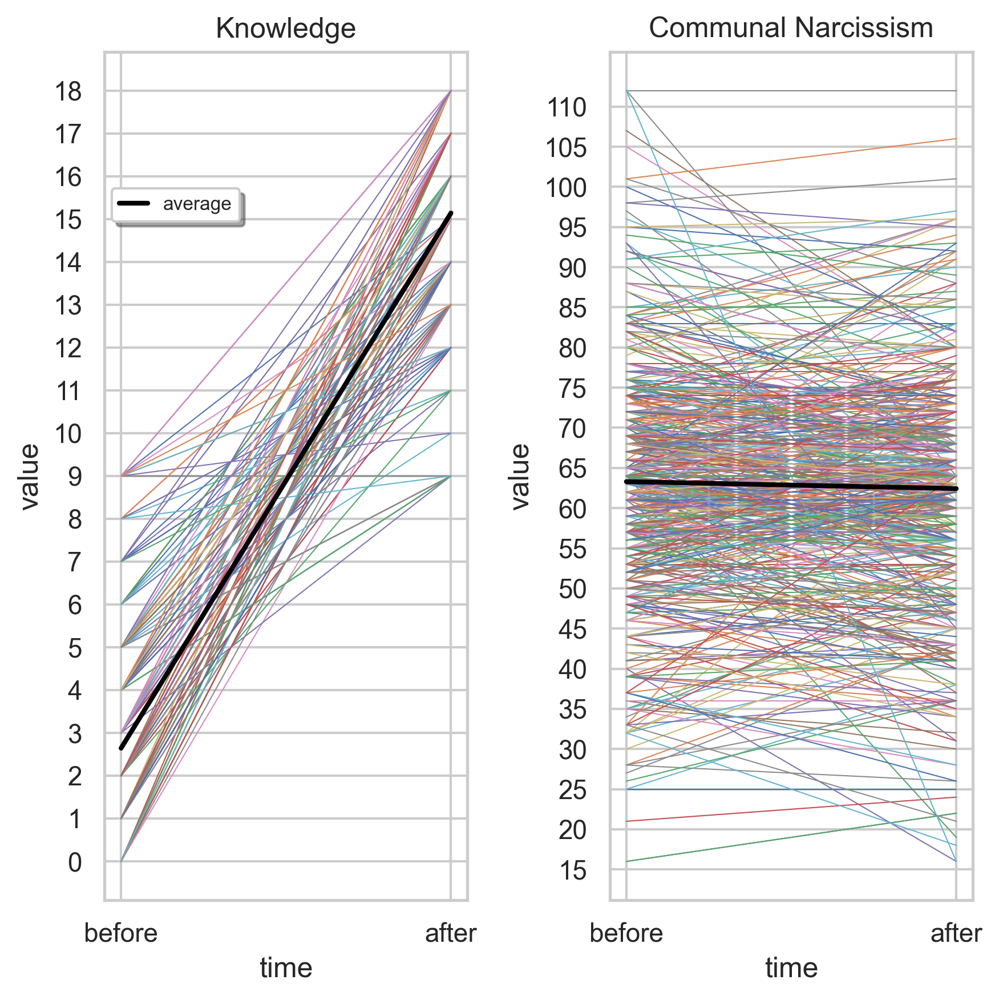

In [11]:
seaborn.set_style("whitegrid")
fig, axs = plt.subplots(1, 2, figsize=(6, 6), dpi=300)

kl_axes = seaborn.lineplot(x='time', y='value', hue='variable', legend=False, linewidth=0.5, data=pandas.melt(pandas.DataFrame(individuals_knowledge_data), ['time']), palette="deep", ax=axs[0])
kl_axes.set_title("Knowledge")
kl_axes.set_yticks([n for n in range(0, 9*2+1)])
kl_axes.plot([0, 1], [sum(paired_plot_data_df[paired_plot_data_df["test"].str.contains('wiedza')]["before"].tolist())/len(ids), sum(paired_plot_data_df[paired_plot_data_df["test"].str.contains('wiedza')]["after"].tolist())/len(ids)], color="black", linewidth=2, label="average")
kl_axes.legend(shadow=True, loc=(0.02, 0.8), handlelength=1.5, fontsize=8)

cni_axes = seaborn.lineplot(x='time', y='value', hue='variable', legend=False, linewidth=0.5, data=pandas.melt(pandas.DataFrame(individuals_cni_data), ['time']), palette="deep", ax=axs[1])
cni_axes.set_title("Communal Narcissism")
cni_axes.set_yticks([n for n in range(0, 16*7+3, 5)])
cni_axes.plot([0, 1], [sum(paired_plot_data_df[paired_plot_data_df["test"].str.contains('cni')]["before"].tolist())/len(ids), sum(paired_plot_data_df[paired_plot_data_df["test"].str.contains('cni')]["after"].tolist())/len(ids)], color="black", linewidth=2, label="average")

plt.tight_layout()
plt.show()

With computed paired sample t-test, Cohen's d values for effect size, and plotted the time changes with mean trajectories, let's work on visualising the questionaires' items relations with partial correlation networks. 

"In probability theory and statistics, partial correlation measures the degree of association between two random variables, with the effect of a set of controlling random variables removed. When determining the numerical relationship between two variables of interest, using their correlation coefficient will give misleading results if there is another confounding variable that is numerically related to both variables of interest. This misleading information can be avoided by controlling for the confounding variable, which is done by computing the partial correlation coefficient." - [Wikipedia](https://en.wikipedia.org/wiki/Partial_correlation) <br>
Partial correlation networks have also been called
concentration graphs (Cox & Wermuth, 1994) or Gaussian
graphical models (Lauritzen, 1996), and are part of a more
general class of statistical models termed pairwise Markov
random fields (see, e.g., Koller & Friedman, 2009 and Murphy,
2012 for an extensive description of pairwise Markov random
fields) - [Epskamp, 2018](https://eiko-fried.com/wp-content/uploads/Epskamp-Fried-2018-Tutorial-partial-corr.pdf)

In calculating the partial correlation, I'll use the inverse of a variance–covariance matrix described in _[Epskamp, S., & Fried, E. I. (2018). A tutorial on regularized partial correlation networks. Psychological Methods, 23(4), 617–634.](https://eiko-fried.com/wp-content/uploads/Epskamp-Fried-2018-Tutorial-partial-corr.pdf)_

In [12]:
selected_data = df_original[variable_list]
data_time_one = selected_data.filter(regex='^(?!.*_t).*$')
data_time_two = selected_data.filter(regex='.*_t.*')

cov_matrix_time_one = data_time_one.cov()
cov_matrix_time_two = data_time_two.cov()

# Moore–Penrose inverse
inverse_cov_matrix_time_one = pandas.DataFrame(numpy.linalg.pinv(cov_matrix_time_one.values), cov_matrix_time_one.columns, cov_matrix_time_one.index)
inverse_cov_matrix_time_two = pandas.DataFrame(numpy.linalg.pinv(cov_matrix_time_two.values), cov_matrix_time_two.columns, cov_matrix_time_two.index)

partial_corr_matrix_time_one = pandas.DataFrame(0, index=inverse_cov_matrix_time_one.index, columns=inverse_cov_matrix_time_one.columns)
for i in range(inverse_cov_matrix_time_one.shape[0]):
    for j in range(inverse_cov_matrix_time_one.shape[1]):
        if i != j:
            partial_corr_matrix_time_one.iloc[i, j] = -inverse_cov_matrix_time_one.iloc[i, j] / numpy.sqrt(inverse_cov_matrix_time_one.iloc[i, i] * inverse_cov_matrix_time_one.iloc[j, j])
        else:
            partial_corr_matrix_time_one.iloc[i, j] = 1.0

partial_corr_matrix_time_two = pandas.DataFrame(0, index=inverse_cov_matrix_time_two.index, columns=inverse_cov_matrix_time_two.columns)
for i in range(inverse_cov_matrix_time_two.shape[0]):
    for j in range(inverse_cov_matrix_time_two.shape[1]):
        if i != j:
            partial_corr_matrix_time_two.iloc[i, j] = -inverse_cov_matrix_time_two.iloc[i, j] / numpy.sqrt(inverse_cov_matrix_time_two.iloc[i, i] * inverse_cov_matrix_time_two.iloc[j, j])
        else:
            partial_corr_matrix_time_two.iloc[i, j] = 1.0

display(partial_corr_matrix_time_one.head())
display(partial_corr_matrix_time_two.head())


,wiedza9,wiedza8,wiedza7,wiedza6,wiedza5,wiedza4,wiedza3,wiedza2,wiedza1,cni9,...,cni3,cni2,cni16,cni15,cni14,cni13,cni12,cni11,cni10,cni1
wiedza9,1.000000,0.152774,0.038006,-0.008644,0.092029,0.127550,0.080663,-0.057135,0.054934,0.038139,...,0.009236,-0.061558,0.000099,0.039445,0.059626,0.023554,-0.001879,0.053933,-0.018385,0.091592
wiedza8,0.152774,1.000000,0.094053,-0.001284,0.111630,0.170227,0.100377,0.007979,0.060442,0.107938,...,0.001380,0.018252,-0.012312,-0.000233,0.062486,-0.058027,-0.026294,-0.001159,0.025103,0.004507
wiedza7,0.038006,0.094053,1.000000,0.152349,0.308665,0.054850,0.112566,0.032932,0.020034,0.040587,...,0.045898,-0.045241,0.072779,0.017402,-0.017095,-0.037473,0.028538,-0.040394,-0.029867,0.000235
wiedza6,-0.008644,-0.001284,0.152349,1.000000,0.020549,0.111985,0.145015,0.162036,0.046386,-0.053683,...,-0.037506,0.026080,0.000327,0.011531,-0.030856,-0.023748,0.014683,0.048313,0.075011,0.058795
wiedza5,0.092029,0.111630,0.308665,0.020549,1.000000,0.105872,0.109541,-0.028986,0.132828,0.013035,...,-0.005818,0.014362,-0.046268,-0.013110,0.024651,0.026132,0.004952,0.011679,-0.011950,0.034938


,wiedza9_t5,wiedza8_t5,wiedza7_t5,wiedza6_t5,wiedza5_t5,wiedza4_t5,wiedza3_t5,wiedza2_t5,wiedza1_t5,cni9_t5,...,cni3_t5,cni2_t5,cni1_t5,cni16_t5,cni15_t5,cni14_t5,cni13_t5,cni12_t5,cni11_t5,cni10_t5
wiedza9_t5,1.000000,0.181171,0.112976,-0.004434,-0.006201,0.005633,0.056163,-0.076215,0.100746,-0.004387,...,-0.082380,0.008549,0.096504,0.022289,0.014986,0.016413,0.022932,0.034864,-0.012494,0.012953
wiedza8_t5,0.181171,1.000000,0.056378,0.086691,0.109918,0.161538,0.132341,0.075641,0.002429,-0.035186,...,-0.020789,0.088659,-0.182065,-0.131033,0.016501,0.035489,-0.057722,0.016247,-0.035658,0.010313
wiedza7_t5,0.112976,0.056378,1.000000,-0.065974,0.075992,-0.061051,0.037829,0.082892,0.033037,0.048699,...,0.090960,0.001032,0.014444,0.025173,0.001870,0.027434,-0.054342,-0.038670,0.104697,-0.068345
wiedza6_t5,-0.004434,0.086691,-0.065974,1.000000,0.178508,0.024555,0.011289,0.163415,0.066000,-0.034120,...,-0.007099,-0.033931,0.064527,0.024213,-0.034684,0.004860,-0.052232,0.010558,0.043049,0.040336
wiedza5_t5,-0.006201,0.109918,0.075992,0.178508,1.000000,0.170125,0.261984,-0.025621,0.151549,0.009591,...,0.004130,0.010166,-0.034539,-0.084087,0.002867,0.044408,0.067951,0.031282,-0.084291,-0.017786


With partial correlation matrixes computed for the time 1 and 2 measurements, let me:
1. calculate the p-values for the difference significance between times 1 & 2 of the measurements (to determine later on which edges are to be shown on the difference graphs);
1. plot the networks - communal narcissims with knowledga at times 1 and 2 
1. plot heatmaps of the partial correlations;
1. plot basic graphs' metric: nodal strength centrality
1. plot networks' bridge strength centrality 

In [13]:
p_value_diff_matrix = pandas.DataFrame(0, index=inverse_cov_matrix_time_one.index, columns=inverse_cov_matrix_time_one.columns)
n_count = df_original['Id'].count()
std_err = numpy.sqrt(1/(n_count - 3) + 1/(n_count - 3))

def fisher_z_transform(r):
    return 0.5 * numpy.log((1 + r) / (1 - r))

def calc_p_value(r1, r2):
    Z1 = fisher_z_transform(r1)
    Z2 = fisher_z_transform(r2)
    Z_diff = (Z1 - Z2) / std_err
    p_value = 2 * (1 - stats.norm.cdf(numpy.abs(Z_diff)))  # two-tailed test
    return p_value

for i in range(inverse_cov_matrix_time_one.shape[0]):
    for j in range(inverse_cov_matrix_time_one.shape[1]):
        if i != j:
            p_value_diff_matrix.iloc[i, j] = calc_p_value(partial_corr_matrix_time_one.iloc[i, j], partial_corr_matrix_time_two.iloc[i, j])
        else:
            p_value_diff_matrix.iloc[i, j] = 1.0

display(p_value_diff_matrix.head())

,wiedza9,wiedza8,wiedza7,wiedza6,wiedza5,wiedza4,wiedza3,wiedza2,wiedza1,cni9,...,cni3,cni2,cni16,cni15,cni14,cni13,cni12,cni11,cni10,cni1
wiedza9,1.000000,0.629948,0.213449,0.944641,0.104299,0.043153,0.684752,0.751934,0.447081,0.482888,...,0.130009,0.247060,0.110732,0.777008,0.460894,0.906210,0.682352,0.752665,0.922585,0.193201
wiedza8,0.629948,1.000000,0.531989,0.145805,0.977195,0.882845,0.593032,0.263441,0.338063,0.017900,...,0.714610,0.244016,0.004604,0.030029,0.447418,0.122677,0.603562,0.774045,0.316136,0.923709
wiedza7,0.213449,0.531989,1.000000,0.000292,0.000062,0.055666,0.214903,0.408286,0.830083,0.893352,...,0.455188,0.445073,0.334951,0.897974,0.754420,0.284223,0.171342,0.977276,0.026028,0.257291
wiedza6,0.944641,0.145805,0.000292,1.000000,0.008365,0.147163,0.026254,0.981358,0.745547,0.746486,...,0.615823,0.322159,0.289013,0.834275,0.949604,0.637009,0.269421,0.533096,0.596799,0.760223
wiedza5,0.104299,0.977195,0.000062,0.008365,1.000000,0.279842,0.009054,0.955718,0.752657,0.954695,...,0.869682,0.944826,0.846361,0.240454,0.719339,0.762802,0.298001,0.746342,0.231555,0.384404


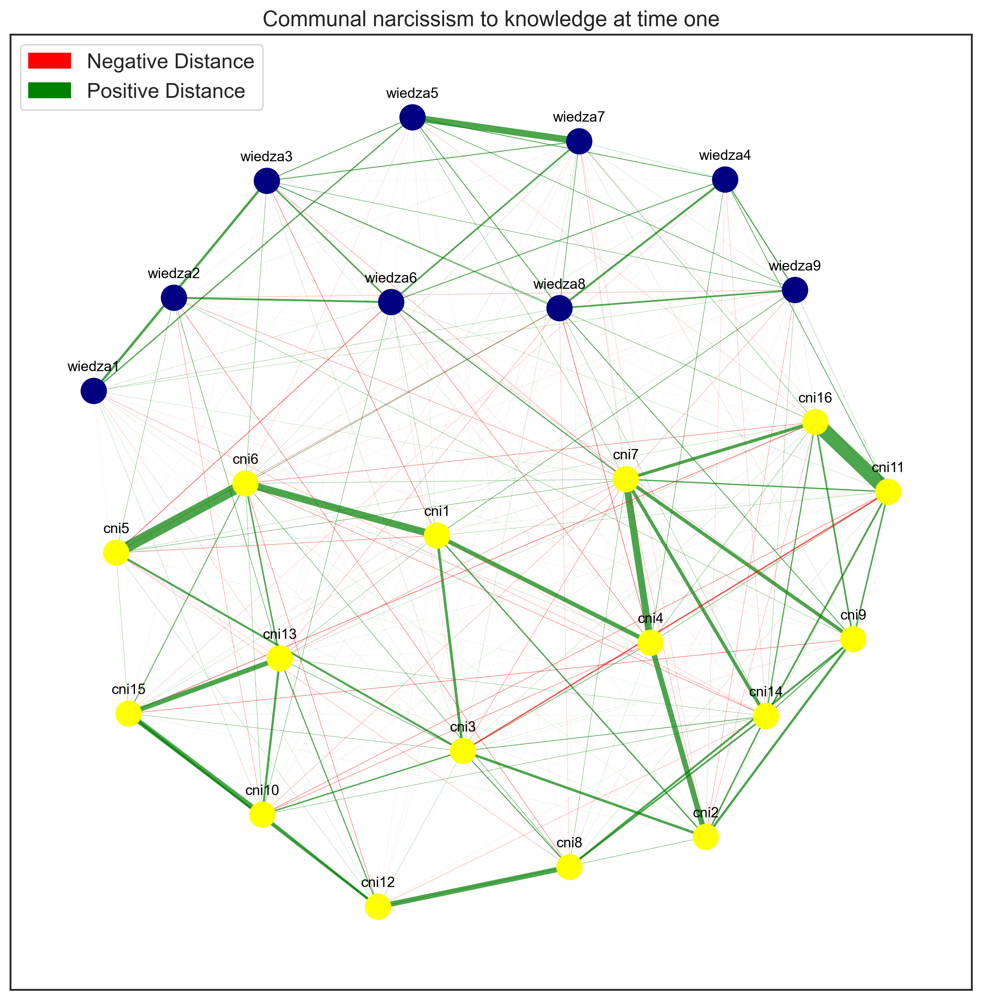

In [14]:
matching_names = [name for name in partial_corr_matrix_time_one.index if "wiedza" in name or "cni" in name]
cni_knowledge_time_one = partial_corr_matrix_time_one.loc[matching_names, matching_names]

seaborn.set_style("white")

graph_cni_knowledge_time_one = networkx.from_pandas_adjacency(cni_knowledge_time_one)
graph_cni_knowledge_time_one.remove_edges_from(networkx.selfloop_edges(graph_cni_knowledge_time_one))

node_colors = ['navy' if 'wiedza' in node else 'yellow' for node in graph_cni_knowledge_time_one.nodes]
edge_colors = ['red' if cni_knowledge_time_one.loc[edge[0], edge[1]] < 0 else 'green' for edge in graph_cni_knowledge_time_one.edges]
edge_width = [abs(cni_knowledge_time_one.loc[edge[0], edge[1]]) for edge in graph_cni_knowledge_time_one.edges]
edge_width_norm_t1 = [10 * (float(i)/max(edge_width))**2 for i in edge_width]

distances = {}
for n, nbrs in graph_cni_knowledge_time_one.adj.items():
    for nbr, eattr in nbrs.items():
        try:
            distances[n][nbr] = 0.25 + (1 - abs(eattr['weight']/max(edge_width)))
        except KeyError as e:
            distances[n] = {nbr: 0.25 + (1 - abs(eattr['weight']/max(edge_width)))}
        # print(f"{n}, {nbr}, {0.25 + (1-abs(eattr['weight']/max(edge_width)))}")

# node_pos_cni_knowledge = networkx.spring_layout(graph_cni_knowledge_time_one, k=1.5, iterations=250, seed=101)
node_pos_cni_knowledge = networkx.kamada_kawai_layout(graph_cni_knowledge_time_one, dist=distances, weight='weight')
pos_higher = {}
y_off = 0.06
for k, v in node_pos_cni_knowledge.items():
    pos_higher[k] = (v[0], v[1]+y_off)

plt.figure(figsize=(12, 12), dpi=300)
networkx.draw_networkx_edges(graph_cni_knowledge_time_one, node_pos_cni_knowledge, edge_color=edge_colors, width=edge_width_norm_t1, alpha=0.7)
networkx.draw_networkx_nodes(graph_cni_knowledge_time_one, node_pos_cni_knowledge, node_color=node_colors, node_size=300)
networkx.draw_networkx_labels(graph_cni_knowledge_time_one, pos_higher, font_size=10, font_color='black')

blue_patch = mpatches.Patch(color='red', label='Negative Distance')
red_patch = mpatches.Patch(color='green', label='Positive Distance')
plt.legend(handles=[blue_patch, red_patch], loc='upper left', fontsize='large')

plt.title("Communal narcissism to knowledge at time one", fontsize=15)
plt.show()

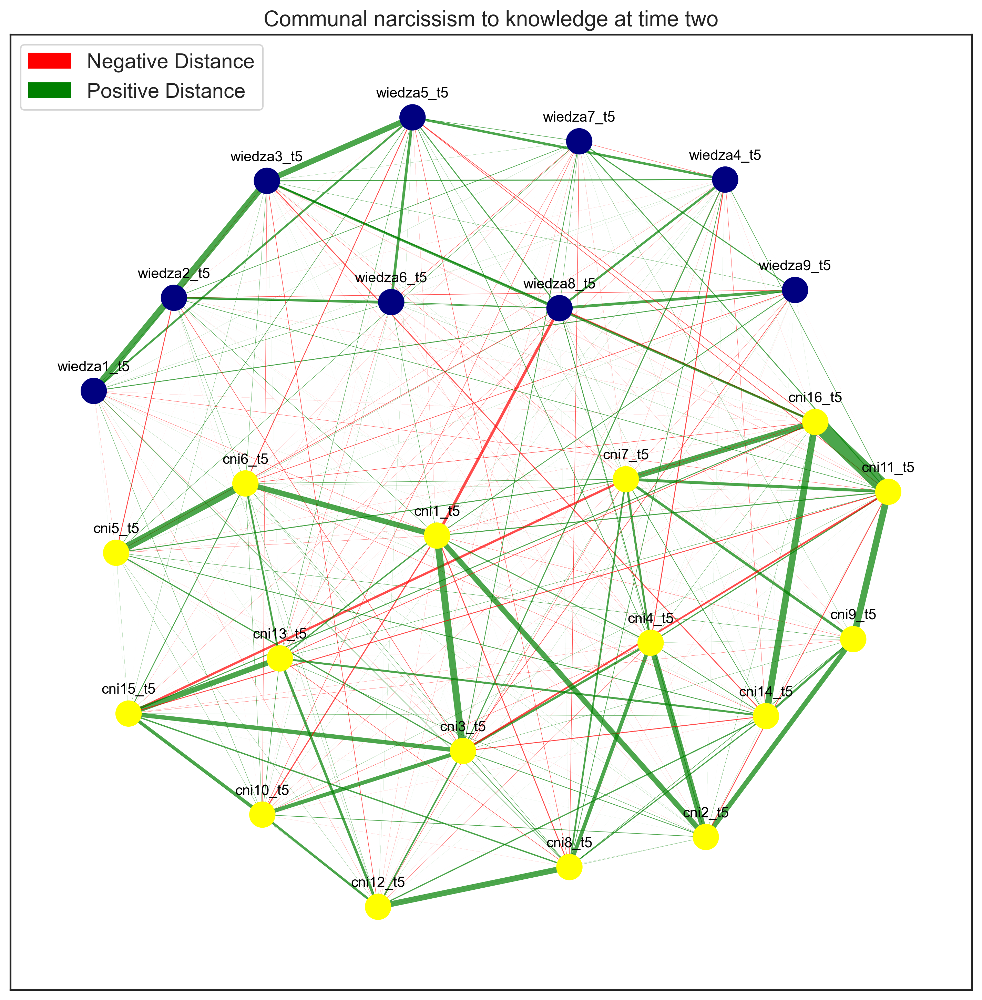

In [17]:
matching_names = [name for name in partial_corr_matrix_time_two.index if "wiedza" in name or "cni" in name]
cni_knowledge_time_two = partial_corr_matrix_time_two.loc[matching_names, matching_names]

seaborn.set_style("white")

graph_cni_knowledge_time_two = networkx.from_pandas_adjacency(cni_knowledge_time_two)
graph_cni_knowledge_time_two.remove_edges_from(networkx.selfloop_edges(graph_cni_knowledge_time_two))

node_pos_cni_knowledge_t5 = {f"{node}_t5": pos for (node, pos) in node_pos_cni_knowledge.items()}
pos_higher = {}
y_off = 0.06
for k, v in node_pos_cni_knowledge_t5.items():
    pos_higher[k] = (v[0], v[1]+y_off)

node_colors = ['navy' if 'wiedza' in node else 'yellow' for node in graph_cni_knowledge_time_two.nodes]
edge_colors = ['red' if cni_knowledge_time_two.loc[edge[0], edge[1]] < 0 else 'green' for edge in graph_cni_knowledge_time_two.edges]
edge_width = [abs(cni_knowledge_time_two.loc[edge[0], edge[1]]) for edge in graph_cni_knowledge_time_two.edges]
edge_width_norm_t2 = [10 * (float(i)/max(edge_width))**2 for i in edge_width]
    
plt.figure(figsize=(12, 12), dpi=300)
networkx.draw_networkx_edges(graph_cni_knowledge_time_two, node_pos_cni_knowledge_t5, edge_color=edge_colors, width=edge_width_norm_t2, alpha=0.7)
networkx.draw_networkx_nodes(graph_cni_knowledge_time_two, node_pos_cni_knowledge_t5, node_color=node_colors, node_size=300)
networkx.draw_networkx_labels(graph_cni_knowledge_time_two, pos_higher, font_size=10, font_color='black')

blue_patch = mpatches.Patch(color='red', label='Negative Distance')
red_patch = mpatches.Patch(color='green', label='Positive Distance')
plt.legend(handles=[blue_patch, red_patch], loc='upper left', fontsize='large')

plt.title("Communal narcissism to knowledge at time two", fontsize=15)
plt.show()

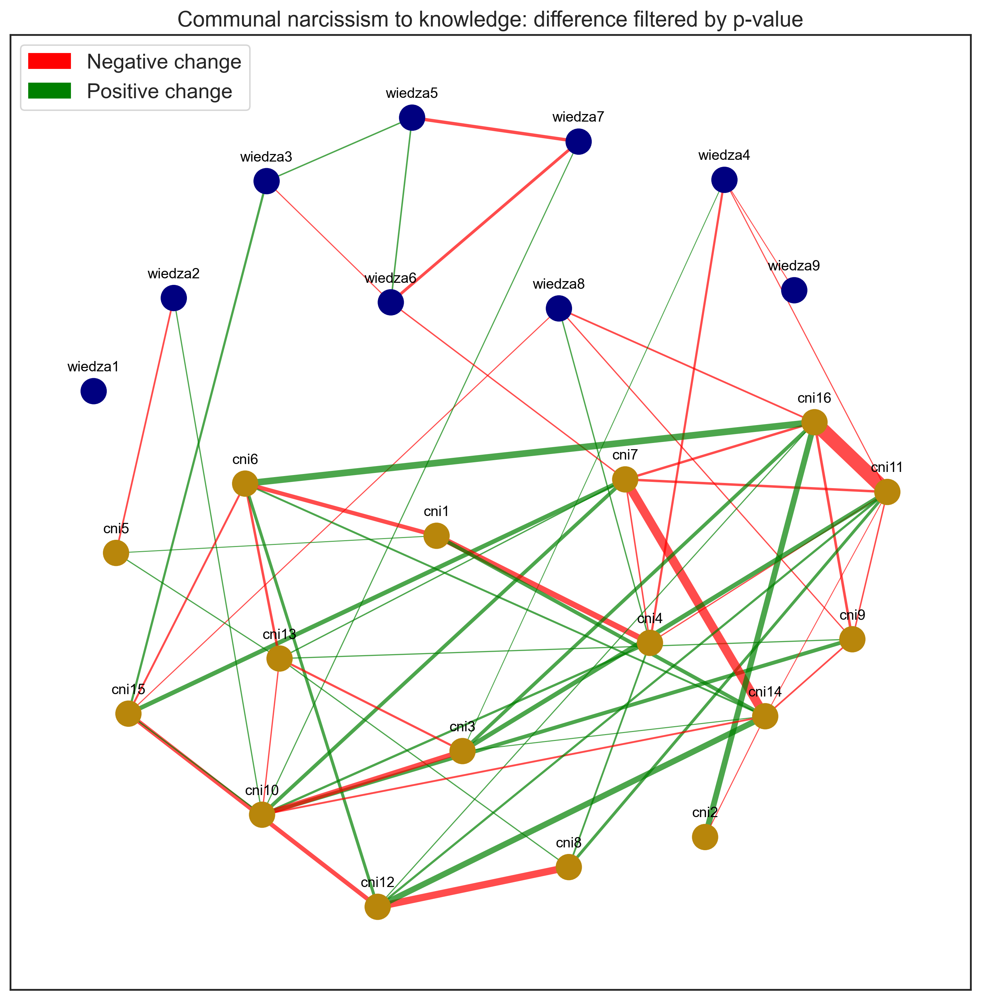

In the above graph there are 62 non-zero edges.


In [28]:
seaborn.set_style("white")

graph_cni_knowledge_diff = networkx.from_pandas_adjacency(cni_knowledge_time_one)
graph_cni_knowledge_diff.remove_edges_from(networkx.selfloop_edges(graph_cni_knowledge_diff))

node_pos_cni_knowledge_diff = {f"{node}": pos for (node, pos) in node_pos_cni_knowledge.items()}
pos_higher = {}
y_off = 0.06
for k, v in node_pos_cni_knowledge_diff.items():
    pos_higher[k] = (v[0], v[1]+y_off)

node_colors = ['navy' if 'wiedza' in node else 'darkgoldenrod' for node in graph_cni_knowledge_diff.nodes]
edge_colors = ['red' if cni_knowledge_time_one.loc[edge_one[0], edge_one[1]] > cni_knowledge_time_two.loc[edge_two[0], edge_two[1]] else 'green' for (edge_one, edge_two) in zip(graph_cni_knowledge_time_one.edges, graph_cni_knowledge_time_two.edges)]
edge_width = [abs(cni_knowledge_time_two.loc[edge_two[0], edge_two[1]] - cni_knowledge_time_one.loc[edge_one[0], edge_one[1]]) if p_value_diff_matrix.loc[edge_one[0], edge_one[1]] < 0.05 else 0 for (edge_one, edge_two) in zip(graph_cni_knowledge_time_one.edges, graph_cni_knowledge_time_two.edges)]
edge_width_norm = [10 * (float(i)/max(edge_width))**2 for i in edge_width]

plt.figure(figsize=(12, 12), dpi=300)
networkx.draw_networkx_edges(graph_cni_knowledge_diff, node_pos_cni_knowledge, edge_color=edge_colors, width=edge_width_norm, alpha=0.7)
networkx.draw_networkx_nodes(graph_cni_knowledge_diff, node_pos_cni_knowledge, node_color=node_colors, node_size=300)
networkx.draw_networkx_labels(graph_cni_knowledge_diff, pos_higher, font_size=10, font_color='black')

blue_patch = mpatches.Patch(color='red', label='Negative change')
red_patch = mpatches.Patch(color='green', label='Positive change')
plt.legend(handles=[blue_patch, red_patch], loc='upper left', fontsize='large')

plt.title("Communal narcissism to knowledge: difference filtered by p-value", fontsize=15)
plt.show()

print(f"In the above graph there are {sum(1 for i in edge_width if i != 0)} non-zero edges.")

Let me display the summary statistics for the above networks - first the average edge values between questionnaires (within group and between groups) - as a heatmap →


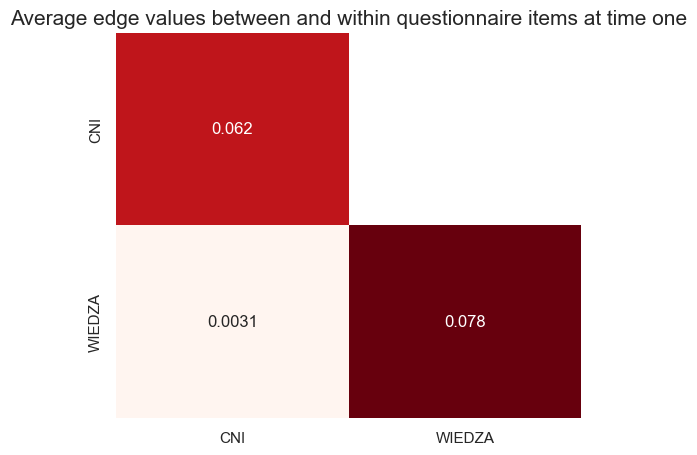

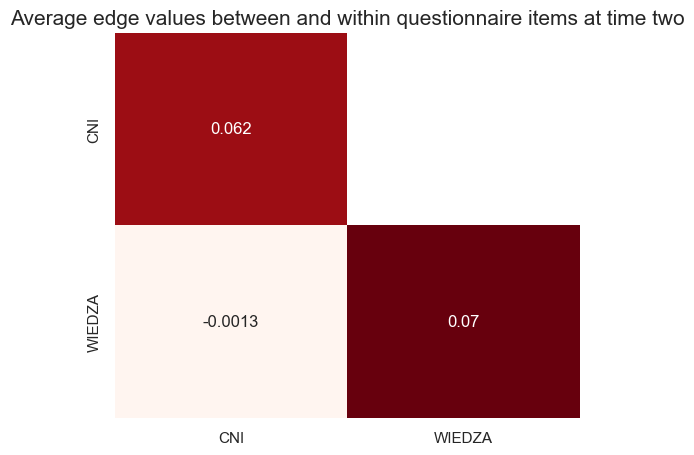

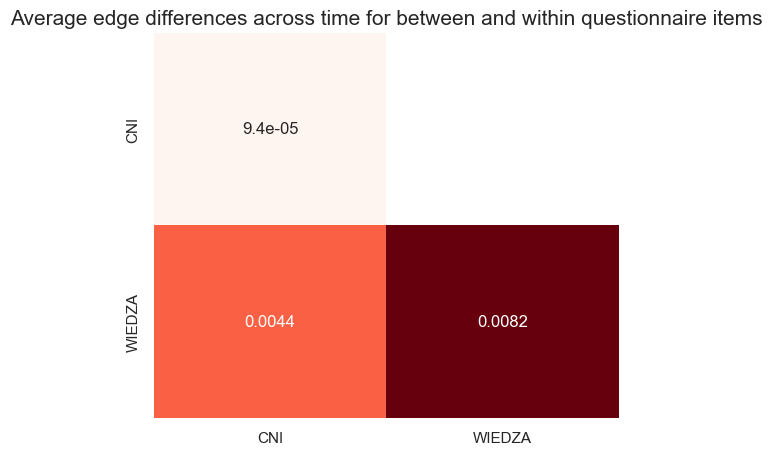

In [29]:
def get_avg_edge_weigths(graph: networkx.classes.graph.Graph, node_A: str, node_B: str) -> int:
    weigth_sum = []
    for n, nbrs in graph.adj.items():
        for nbr, eattr in nbrs.items():
            if node_A in n and node_B in nbr:
                weigth_sum.append(eattr['weight'])
    return numpy.average(weigth_sum)

node_group_A = ['cni', 'wiedza']
node_group_B = ['WHO', 'zagr']
node_group_C = ['maseczki', 'mycie', 'odkazanie', 'siedz']

graph_cni_knowledge_avg_edges_t1 = {}
for outer_node_type in node_group_A:
    for inner_node_type in node_group_A:
        try:
            graph_cni_knowledge_avg_edges_t1[outer_node_type][inner_node_type] = get_avg_edge_weigths(graph_cni_knowledge_time_one, outer_node_type, inner_node_type)
        except KeyError as e:
            graph_cni_knowledge_avg_edges_t1[outer_node_type] = {inner_node_type: get_avg_edge_weigths(graph_cni_knowledge_time_one, outer_node_type, inner_node_type)}

graph_cni_knowledge_avg_edges_t2 = {}
for outer_node_type in node_group_A:
    for inner_node_type in node_group_A:
        try:
            graph_cni_knowledge_avg_edges_t2[outer_node_type][inner_node_type] = get_avg_edge_weigths(graph_cni_knowledge_time_two, outer_node_type, inner_node_type)
        except KeyError as e:
            graph_cni_knowledge_avg_edges_t2[outer_node_type] = {inner_node_type: get_avg_edge_weigths(graph_cni_knowledge_time_two, outer_node_type, inner_node_type)}

graph_cni_knowledge_avg_edges_diff = {}
for outer_key in graph_cni_knowledge_avg_edges_t1.keys():
    for inner_key in graph_cni_knowledge_avg_edges_t1[outer_key].keys():
        try:
            graph_cni_knowledge_avg_edges_diff[outer_key][inner_key] = graph_cni_knowledge_avg_edges_t1[outer_key][inner_key] - graph_cni_knowledge_avg_edges_t2[outer_key][inner_key]
        except KeyError as e:
            graph_cni_knowledge_avg_edges_diff[outer_key] = {inner_key: graph_cni_knowledge_avg_edges_t1[outer_key][inner_key] - graph_cni_knowledge_avg_edges_t2[outer_key][inner_key]}

data_t1 = numpy.array([
    [graph_cni_knowledge_avg_edges_t1['cni']['cni'], numpy.nan],
    [graph_cni_knowledge_avg_edges_t1['cni']['wiedza'], graph_cni_knowledge_avg_edges_t1['wiedza']['wiedza']]
])
df = pandas.DataFrame(data_t1, index=['CNI', 'WIEDZA'], columns=['CNI', 'WIEDZA'])
plt.figure(figsize=(6, 5))
seaborn.heatmap(df, annot=True, cmap="Reds", mask=df.isnull(), cbar=False)
plt.title("Average edge values between and within questionnaire items at time one", fontsize=15)
plt.show()

data_t2 = numpy.array([
    [graph_cni_knowledge_avg_edges_t2['cni']['cni'], numpy.nan],
    [graph_cni_knowledge_avg_edges_t2['cni']['wiedza'], graph_cni_knowledge_avg_edges_t2['wiedza']['wiedza']]
])
df = pandas.DataFrame(data_t2, index=['CNI', 'WIEDZA'], columns=['CNI', 'WIEDZA'])
plt.figure(figsize=(6, 5))
seaborn.heatmap(df, annot=True, cmap="Reds", mask=df.isnull(), cbar=False)
plt.title("Average edge values between and within questionnaire items at time two", fontsize=15)
plt.show()

data_diff = numpy.array([
    [graph_cni_knowledge_avg_edges_diff['cni']['cni'], numpy.nan],
    [graph_cni_knowledge_avg_edges_diff['cni']['wiedza'], graph_cni_knowledge_avg_edges_diff['wiedza']['wiedza']]
])
df = pandas.DataFrame(data_diff, index=['CNI', 'WIEDZA'], columns=['CNI', 'WIEDZA'])
plt.figure(figsize=(6, 5))
seaborn.heatmap(df, annot=True, cmap="Reds", mask=df.isnull(), cbar=False)
plt.title("Average edge differences across time for between and within questionnaire items", fontsize=15)
plt.show()


\- second: the 10 strongest edges at each time point (between which nodes largest weigth) - as a table →

In [35]:
graph_time_one_sorted = sorted(graph_cni_knowledge_time_one.edges(data=True), key= lambda x: x[2]['weight'], reverse=True)
graph_time_two_sorted = sorted(graph_cni_knowledge_time_two.edges(data=True), key= lambda x: x[2]['weight'], reverse=True)

strongest_edges_data = {'time 1 edge': [],
                       'time 1 weight': [],
                       'time 2 edge': [],
                       'time 2 weight': []}
for i in range(0, 10):
    strongest_edges_data['time 1 edge'].append(f"{graph_time_one_sorted[i][0]} ↔ {graph_time_one_sorted[i][1]}")
    strongest_edges_data['time 1 weight'].append(graph_time_one_sorted[i][2]['weight'])
    strongest_edges_data['time 2 edge'].append(f"{graph_time_two_sorted[i][0]} ↔ {graph_time_two_sorted[i][1]}")
    strongest_edges_data['time 2 weight'].append(graph_time_two_sorted[i][2]['weight'])

strongest_edges_df = pandas.DataFrame(strongest_edges_data)
display(strongest_edges_df)

,time 1 edge,time 1 weight,time 2 edge,time 2 weight
0,cni16 ↔ cni11,0.451747,cni16_t5 ↔ cni11_t5,0.415817
1,cni6 ↔ cni5,0.390688,cni6_t5 ↔ cni5_t5,0.302849
2,cni6 ↔ cni1,0.319281,cni3_t5 ↔ cni1_t5,0.286265
3,cni7 ↔ cni4,0.313437,wiedza3_t5 ↔ wiedza1_t5,0.284393
4,wiedza7 ↔ wiedza5,0.308665,cni16_t5 ↔ cni14_t5,0.282221
5,cni4 ↔ cni2,0.276474,cni9_t5 ↔ cni11_t5,0.281606
6,cni8 ↔ cni12,0.270908,cni4_t5 ↔ cni2_t5,0.265932
7,cni15 ↔ cni10,0.267482,cni8_t5 ↔ cni12_t5,0.263490
8,cni15 ↔ cni13,0.261743,wiedza5_t5 ↔ wiedza3_t5,0.261984
9,cni4 ↔ cni1,0.247463,cni7_t5 ↔ cni16_t5,0.261372


Text(0.5, 1.0, 'Edge values heatmap at time one')

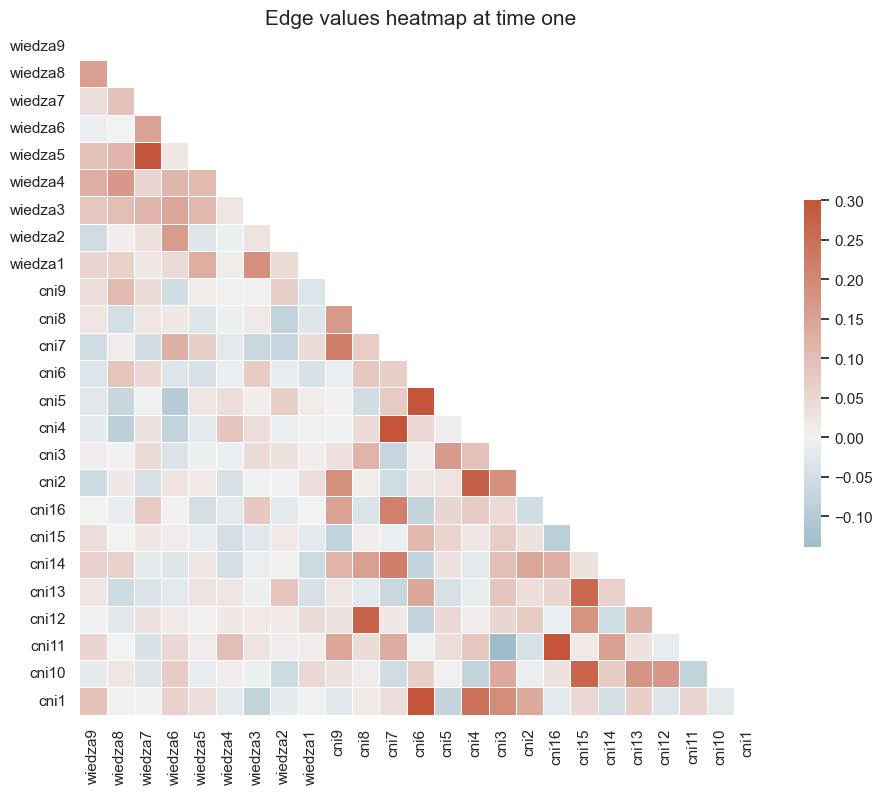

In [36]:
mask = numpy.triu(numpy.ones_like(partial_corr_matrix_time_one, dtype=bool))

fig, ax = plt.subplots(figsize=(11, 9))

cmap = seaborn.diverging_palette(230, 20, as_cmap=True)

seaborn.heatmap(partial_corr_matrix_time_one, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title("Edge values heatmap at time one", fontsize=15)

Text(0.5, 1.0, 'Edge values heatmap at time two')

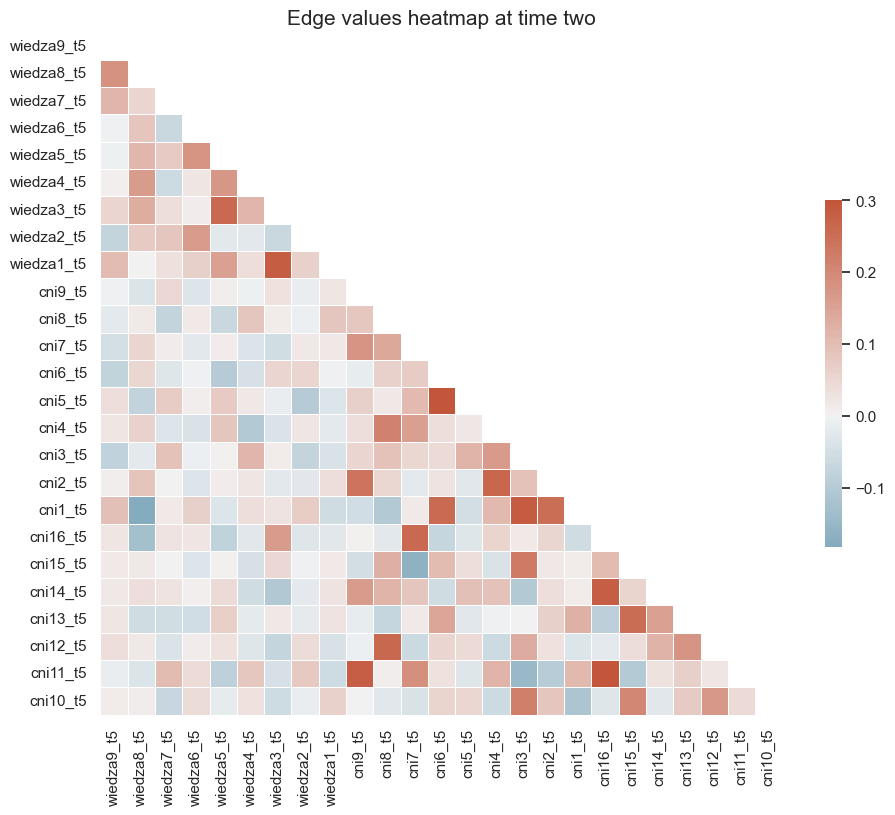

In [37]:
mask = numpy.triu(numpy.ones_like(partial_corr_matrix_time_two, dtype=bool))

fig, ax = plt.subplots(figsize=(11, 9))

cmap = seaborn.diverging_palette(230, 20, as_cmap=True)

seaborn.heatmap(partial_corr_matrix_time_two, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title("Edge values heatmap at time two", fontsize=15)

Now, let me calculate the nodal strength centrality, as defined in [Yu, J., Mahendran, R. COVID-19 lockdown has altered the dynamics between affective symptoms and social isolation among older adults: results from a longitudinal network analysis. Sci Rep 11, 14739 (2021)](https://www.nature.com/articles/s41598-021-94301-6): _"Global strength refers to the sum of the absolute values of all edges in the network. The edge value represents the partial correlation between a pair of nodes after controlling for the influence of other nodes. The nodal strength centrality is the sum of these absolute values from all edges that connect to the node."_

In [38]:
nodal_strength_centrality_time_one = {}
for column in partial_corr_matrix_time_one.columns:
    nodal_strength_centrality_time_one[column] = partial_corr_matrix_time_one[column].abs().sum() - 1 # -1 for variance
    
nodal_strength_centrality_time_two = {}
for column in partial_corr_matrix_time_two.columns:
    nodal_strength_centrality_time_two[column[:-3]] = partial_corr_matrix_time_two[column].abs().sum() - 1 # -1 for variance

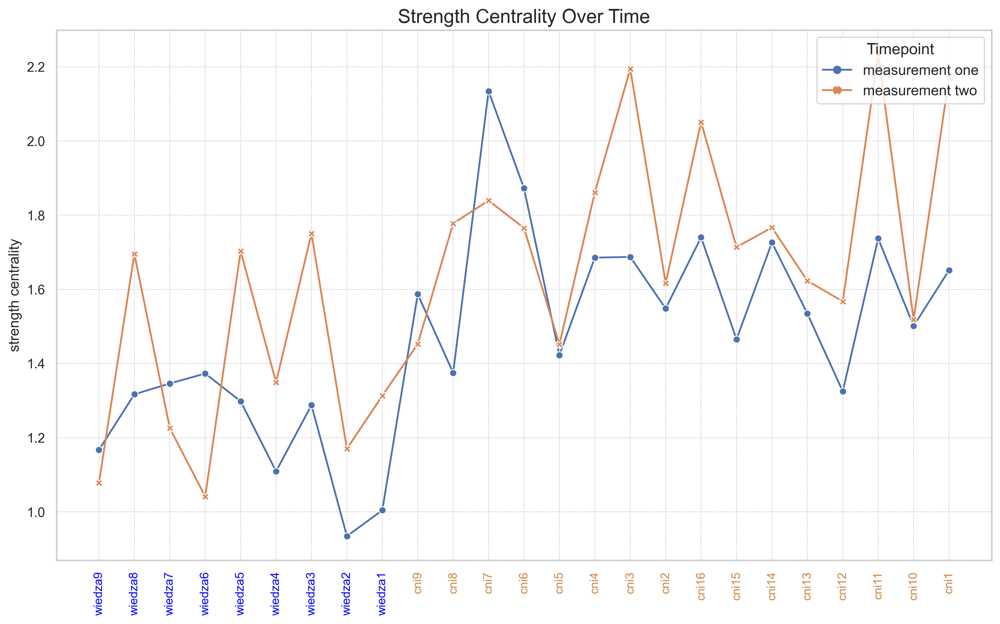

In [39]:
seaborn.set(style="whitegrid")

data_time_one = {
    'variable': nodal_strength_centrality_time_one.keys(),
    'strength centrality': nodal_strength_centrality_time_one.values(),
    'timepoint': ['measurement one' for variable in nodal_strength_centrality_time_one.keys()]
}
data_time_two = {
    'variable': nodal_strength_centrality_time_two.keys(),
    'strength centrality': nodal_strength_centrality_time_two.values(),
    'timepoint': ['measurement two' for variable in nodal_strength_centrality_time_two.keys()]
}
data_time_one = pandas.DataFrame(data_time_one)
data_time_two = pandas.DataFrame(data_time_two)
data = pandas.concat([data_time_one, data_time_two])

plt.figure(figsize=(14, 8), dpi=300)
seaborn.lineplot(x='variable', y='strength centrality', hue='timepoint', style='timepoint', data=data, markers=True, dashes=False)

plt.xticks(rotation=90, fontsize=10)
plt.xlabel('')

plt.legend(title='Timepoint', fontsize=12, title_fontsize='13', loc='upper right')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.gca().set_axisbelow(True)

for tick_label in plt.gca().get_xticklabels():
    if 'wiedza' in tick_label.get_text():
        tick_label.set_color('blue')
    elif 'cni' in tick_label.get_text():
        tick_label.set_color('peru')
    elif 'WHO' in tick_label.get_text():
        tick_label.set_color('green')
    elif 'DT' in tick_label.get_text():
        tick_label.set_color('black')
    else:
        tick_label.set_color('red')

plt.title('Strength Centrality Over Time', fontsize=16)

plt.show()

Finally, let me calculate the nodal bridge centrality, as defined in [Yu, J., Mahendran, R. COVID-19 lockdown has altered the dynamics between affective symptoms and social isolation among older adults: results from a longitudinal network analysis. Sci Rep 11, 14739 (2021)](https://www.nature.com/articles/s41598-021-94301-6): _"Bridge strength centrality indicates the sum of all absolute edge values from a node that connects to
other communities."_

In [63]:
knowledge_rows_cni_columns_time_one = partial_corr_matrix_time_one.loc[partial_corr_matrix_time_one.index.str.contains('wiedza'), partial_corr_matrix_time_one.columns.str.contains('cni')]
cni_rows_knowledge_columns_time_one = partial_corr_matrix_time_one.loc[partial_corr_matrix_time_one.index.str.contains('cni'), partial_corr_matrix_time_one.columns.str.contains('wiedza')]
sum_knowledge_cni_time_one = knowledge_rows_cni_columns_time_one.sum(axis=0)
sum_cni_knowledge_time_one = cni_rows_knowledge_columns_time_one.sum(axis=0)
bridge_centrality_time_one = pandas.concat([sum_knowledge_cni_time_one, sum_cni_knowledge_time_one])
bridge_centrality_time_one = pandas.DataFrame(bridge_centrality_time_one).T

knowledge_rows_cni_columns_time_two = partial_corr_matrix_time_two.loc[partial_corr_matrix_time_two.index.str.contains('wiedza'), partial_corr_matrix_time_two.columns.str.contains('cni')]
cni_rows_knowledge_columns_time_two = partial_corr_matrix_time_two.loc[partial_corr_matrix_time_two.index.str.contains('cni'), partial_corr_matrix_time_two.columns.str.contains('wiedza')]
sum_knowledge_cni_time_two = knowledge_rows_cni_columns_time_two.sum(axis=0)
sum_cni_knowledge_time_two = cni_rows_knowledge_columns_time_two.sum(axis=0)
bridge_centrality_time_two = pandas.concat([sum_knowledge_cni_time_two, sum_cni_knowledge_time_two])
bridge_centrality_time_two = pandas.DataFrame(bridge_centrality_time_two).T

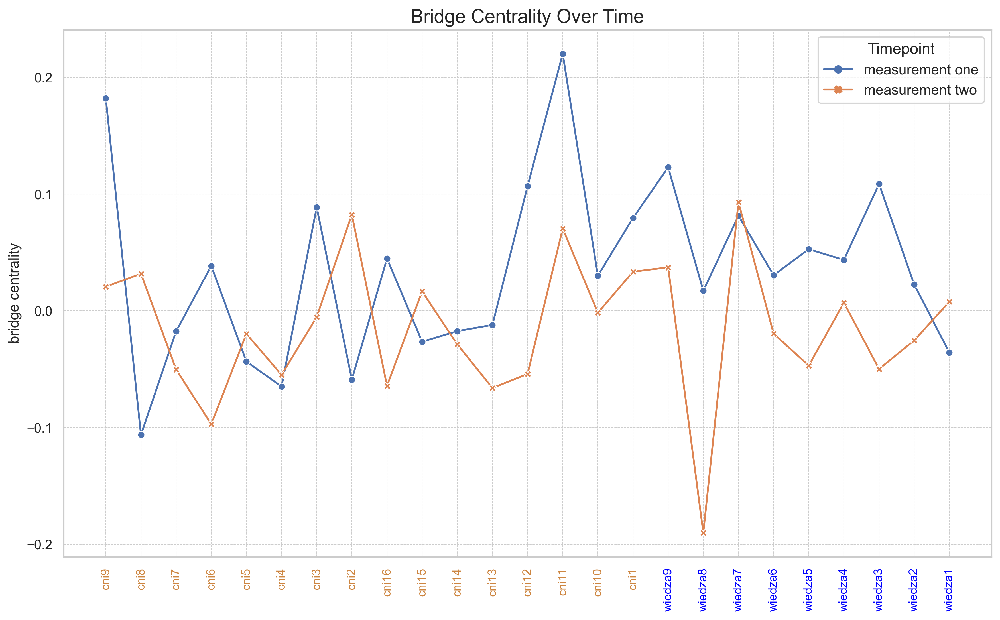

In [67]:
seaborn.set(style="whitegrid")

data_time_one = {
    'variable': bridge_centrality_time_one.columns.tolist(),
    'bridge centrality': bridge_centrality_time_one.values.tolist()[0],
    'timepoint': ['measurement one' for variable in bridge_centrality_time_one.columns.tolist()]
}

data_time_two = {
    'variable': [name[:-3] for name in bridge_centrality_time_two.columns.tolist()],
    'bridge centrality': bridge_centrality_time_two.values.tolist()[0],
    'timepoint': ['measurement two' for variable in bridge_centrality_time_two.columns.tolist()]
}
data_time_one = pandas.DataFrame(data_time_one)
data_time_two = pandas.DataFrame(data_time_two)
data = pandas.concat([data_time_one, data_time_two])

plt.figure(figsize=(14, 8), dpi=300)
seaborn.lineplot(x='variable', y='bridge centrality', hue='timepoint', style='timepoint', data=data, markers=True, dashes=False)

plt.xticks(rotation=90, fontsize=10)
plt.xlabel('')

plt.legend(title='Timepoint', fontsize=12, title_fontsize='13', loc='upper right')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.gca().set_axisbelow(True)

for tick_label in plt.gca().get_xticklabels():
    if 'wiedza' in tick_label.get_text():
        tick_label.set_color('blue')
    elif 'cni' in tick_label.get_text():
        tick_label.set_color('peru')
    elif 'WHO' in tick_label.get_text():
        tick_label.set_color('green')
    elif 'DT' in tick_label.get_text():
        tick_label.set_color('black')
    else:
        tick_label.set_color('red')

plt.title('Bridge Centrality Over Time', fontsize=16)

plt.show()